In [2]:
import os
os.environ["CRDS_PATH"] = os.path.expanduser("~/crds_cache")
os.makedirs(os.environ["CRDS_PATH"], exist_ok=True)

os.environ["CRDS_SERVER_URL"] = "https://jwst-crds.stsci.edu"
os.environ["CRDS_CONTEXT"] = "jwst_1460.pmap"
from astropy.table import Table
import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u
from astroquery.svo_fps import SvoFps
from astropy.wcs import WCS
from astropy.io import fits
from extinction import apply
from astropy.modeling import models
import extinction
from dust_extinction.averages import RL85_MWGC

def get_mag(catalog, ww, filtername='f140m'):
    print(ww.proj_plane_pixel_area())
    flux= (catalog['flux_fit_' + filtername] * u.MJy/u.sr * ww.proj_plane_pixel_area()).to(u.Jy)
    eflux_jy = (catalog['flux_err_' + filtername] * u.MJy/u.sr *  ww.proj_plane_pixel_area()).to(u.Jy)

    jfilts = SvoFps.get_filter_list('JWST')
    jfilts.add_index('filterID')
    zeropoint = u.Quantity(jfilts.loc[f'JWST/NIRCam.{filtername.upper()}']['ZeroPoint'], u.Jy)
    abmag = -2.5 * np.log10(flux / zeropoint) * u.mag
    abmag_err = 2.5 / np.log(10) * np.abs(eflux_jy / flux) * u.mag

    return abmag, abmag_err

def plot_extvec_ccd(ax, color1, color2, ext=RL85_MWGC(), extvec_scale=200,
                    start=(0, 0),
                    color='y', head_width=0.5):
    def get_wave(c):
        if c == '410m405': return 4.10*u.um
        if c == '405m410': return 4.05*u.um
        if c == 'Hmag': return 1.634*u.um
        if c == 'Ksmag': return 2.143527*u.um
        return int(c[1:-1])/100*u.um

    w1 = get_wave(color1[0])
    w2 = get_wave(color1[1])
    w3 = get_wave(color2[0])
    w4 = get_wave(color2[1])

    if w1 > w2:
        w1, w2 = w2, w1
        color1 = color1[::-1]
    if w3 > w4:
        w3, w4 = w4, w3
        color2 = color2[::-1]
    print(w1,w2,w3,w4)

    # Only plot if all are in valid range
    try:
        e_1 = ext(1/w1) * extvec_scale
        e_2 = ext(1/w2) * extvec_scale
        e_3 = ext(1/w3) * extvec_scale
        e_4 = ext(1/w4) * extvec_scale
    except ValueError as e:
        print(f"Extinction vector not plotted: {e}")
        return
    print(w1,w2,w3,w4)
    print(e_1, e_2, e_3, e_4)
    ax.annotate(f'$A_V={extvec_scale}$', xy=(start[0] + (e_1 - e_2), start[1] + (e_3 - e_4)),
                xytext=(start[0], start[1]),
                arrowprops=dict(arrowstyle='-|>', color=color,
                                shrinkA=0, shrinkB=0,
                                mutation_scale=20, linewidth=1.5))
    ax.plot([], [], color=color, marker='>', markersize=8,
            label=f'$A_V={extvec_scale}$', linestyle='-', linewidth=2)

from astropy.table import Table
import crds
parsec_av0 = Table.read('/home/t.yoo/parsec_av0.txt', format='ascii')
parsec_av0.pprint(max_width=-1, max_lines=-1)    
m_init = parsec_av0['col4']  
parsec_av0 = parsec_av0[m_init<300]                    
logage_av0 = parsec_av0['col3']
mass_av0 = parsec_av0['col6']
F140Mmag_av0 = parsec_av0['col39'] + 5*np.log10(5400)-5
F162Mmag_av0 = parsec_av0['col40']+ 5*np.log10(5400)-5
F182Mmag_av0 = parsec_av0['col41']+ 5*np.log10(5400)-5
F210Mmag_av0 = parsec_av0['col42']+ 5*np.log10(5400)-5
F335Mmag_av0 = parsec_av0['col45']+ 5*np.log10(5400)-5
F360Mmag_av0 = parsec_av0['col46']+ 5*np.log10(5400)-5
F410Mmag_av0 = parsec_av0['col47']+ 5*np.log10(5400)-5
F480Mmag_av0 = parsec_av0['col50']+ 5*np.log10(5400)-5

parsec_av5 = Table.read('/home/t.yoo/parsec_av5.txt', format='ascii')
logage_av5 = parsec_av5['col3']
mass_av5 = parsec_av5['col6']
F140Mmag_av5 = parsec_av5['col39']+ 5*np.log10(5400)-5
F162Mmag_av5 = parsec_av5['col40'] + 5*np.log10(5400)-5
F182Mmag_av5 = parsec_av5['col41']+ 5*np.log10(5400)-5
F210Mmag_av5 = parsec_av5['col42']+ 5*np.log10(5400)-5
F335Mmag_av5 = parsec_av5['col45']+ 5*np.log10(5400)-5
F360Mmag_av5 = parsec_av5['col46']+ 5*np.log10(5400)-5
F410Mmag_av5 = parsec_av5['col47']+ 5*np.log10(5400)-5
F480Mmag_av5 = parsec_av5['col50']+ 5*np.log10(5400)-5

parsec_av10 = Table.read('/home/t.yoo/parsec_av10.txt', format='ascii')
logage_av10 = parsec_av10['col3']
mass_av10 = parsec_av10['col6']
F140Mmag_av10 = parsec_av10['col39']+ 5*np.log10(5400)-5
F162Mmag_av10 = parsec_av10['col40']+ 5*np.log10(5400)-5
F182Mmag_av10 = parsec_av10['col41']+ 5*np.log10(5400)-5
F210Mmag_av10 = parsec_av10['col42']+ 5*np.log10(5400)-5
F335Mmag_av10 = parsec_av10['col45']+ 5*np.log10(5400)-5
F360Mmag_av10 = parsec_av10['col46']+ 5*np.log10(5400)-5
F410Mmag_av10 = parsec_av10['col47']+ 5*np.log10(5400)-5
F480Mmag_av10 = parsec_av10['col50']+ 5*np.log10(5400)-5


import asdf

def load_nircam_abvega_offsets(asdf_path, filter_name):
    """
    Load JWST NIRCam AB–Vega offset reference file (ASDF) 
    and return a dict mapping filter names → offsets (in mag).
    
    The ASDF file is expected to follow the JWST CRDS “FILTEROFFSET”
    (or an equivalent zeropoint offset) schema.
    """
    with asdf.open(asdf_path) as af:
        tree = af.tree
        # The offsets might live under some key, e.g. tree["offsets"] or tree["filters"]
        # Inspect the file structure to adapt:
        # For example, tree["data"] or tree["offsets"] or tree["filters"]
        # Here’s a guess:
        tabs = tree.get("abvega_offset", None)
        idx = np.where((tabs['filter'] == filter_name.upper()) & (tabs['pupil']=='CLEAR'))[0]
        if len(idx)!=1:
            idx = np.where(tabs['pupil']==filter_name.upper())[0]
        tabs.pprint(max_width=-1, max_lines=-1)
        print(idx)
        return tabs['abvega_offset'][idx].item()


def vega_to_ab(vega_mag, filter_name, asdf_path):
    """
    Convert Vega magnitude to AB magnitude using offset dictionary.
    """
    offset = load_nircam_abvega_offsets(asdf_path, filter_name)
   
    return vega_mag + offset

"""
from astropy.io import fits
hdr = fits.getheader(image_filenames['f140m'], ext=('SCI', 1))
print(hdr)
crds_params = {
    "INSTRUME": "NIRCAM",
    "DETECTOR": 'NRCA1',  # or NRCB5, etc.
    "META.OBSERVATION.DATE": hdr['DATE-OBS']  # Use the actual observation date
}

# Path or URL to your .rmap file
ref_file = crds.getreferences(crds_params, ["abvegaoffset"], context="jwst_1460.pmap")

rmap = crds.rmap.load_mapping(ref_file["nircam_abvegaoffset"]
)
references = rmap.get_data()
"""
#asdf_file = crds.get_reference_file("jwst", refname)
asdf_file = '/home/t.yoo/w51/w51_nircam/jwst_nircam_abvegaoffset_0002.asdf'
F140M_avmag_av0 = vega_to_ab(F140Mmag_av0, 'F140M', asdf_file)
F162M_avmag_av0 = vega_to_ab(F162Mmag_av0, 'F162M', asdf_file)
F182M_avmag_av0 = vega_to_ab(F182Mmag_av0, 'F182M', asdf_file)
F210M_avmag_av0 = vega_to_ab(F210Mmag_av0, 'F210M', asdf_file)
F335M_avmag_av0 = vega_to_ab(F335Mmag_av0, 'F335M', asdf_file)
F360M_avmag_av0 = vega_to_ab(F360Mmag_av0, 'F360M', asdf_file)
F410M_avmag_av0 = vega_to_ab(F410Mmag_av0, 'F410M', asdf_file)
F480M_avmag_av0 = vega_to_ab(F480Mmag_av0, 'F480M', asdf_file)

F140M_avmag_av5 = vega_to_ab(F140Mmag_av5, 'F140M', asdf_file)
F162M_avmag_av5 = vega_to_ab(F162Mmag_av5, 'F162M', asdf_file)
F182M_avmag_av5 = vega_to_ab(F182Mmag_av5, 'F182M', asdf_file)
F210M_avmag_av5 = vega_to_ab(F210Mmag_av5, 'F210M', asdf_file)
F335M_avmag_av5 = vega_to_ab(F335Mmag_av5, 'F335M', asdf_file)
F360M_avmag_av5 = vega_to_ab(F360Mmag_av5, 'F360M', asdf_file)
F410M_avmag_av5 = vega_to_ab(F410Mmag_av5, 'F410M', asdf_file)
F480M_avmag_av5 = vega_to_ab(F480Mmag_av5, 'F480M', asdf_file)

F140M_avmag_av10 = vega_to_ab(F140Mmag_av10, 'F140M', asdf_file)
F162M_avmag_av10 = vega_to_ab(F162Mmag_av10, 'F162M', asdf_file)
F182M_avmag_av10 = vega_to_ab(F182Mmag_av10, 'F182M', asdf_file)
F210M_avmag_av10 = vega_to_ab(F210Mmag_av10, 'F210M', asdf_file)
F335M_avmag_av10 = vega_to_ab(F335Mmag_av10, 'F335M', asdf_file)
F360M_avmag_av10 = vega_to_ab(F360Mmag_av10, 'F360M', asdf_file)
F410M_avmag_av10 = vega_to_ab(F410Mmag_av10, 'F410M', asdf_file)
F480M_avmag_av10 = vega_to_ab(F480Mmag_av10, 'F480M', asdf_file)


    


catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/final_nircam_indivexp_merged_dao_refined.fits')

image_filenames ={
    "f140m": "/orange/adamginsburg/jwst/w51/F140M/pipeline/jw06151-o001_t001_nircam_clear-f140m-merged_i2d.fits",
    "f150w": "/orange/adamginsburg/jwst/w51/F150W/pipeline/jw06151-o001_t001_nircam_clear-f150w-merged_i2d.fits",
    "f162m": "/orange/adamginsburg/jwst/w51/F162M/pipeline/jw06151-o001_t001_nircam_clear-f162m-merged_i2d.fits",
    "f182m": "/orange/adamginsburg/jwst/w51/F182M/pipeline/jw06151-o001_t001_nircam_clear-f182m-merged_i2d.fits",
    "f187n": "/orange/adamginsburg/jwst/w51/F187N/pipeline/jw06151-o001_t001_nircam_clear-f187n-merged_i2d.fits",
    "f210m": "/orange/adamginsburg/jwst/w51/F210M/pipeline/jw06151-o001_t001_nircam_clear-f210m-merged_i2d.fits",
    "f335m": "/orange/adamginsburg/jwst/w51/F335M/pipeline/jw06151-o001_t001_nircam_clear-f335m-merged_i2d.fits",
    "f360m": "/orange/adamginsburg/jwst/w51/F360M/pipeline/jw06151-o001_t001_nircam_clear-f360m-merged_i2d.fits",
    "f405n": "/orange/adamginsburg/jwst/w51/F405N/pipeline/jw06151-o001_t001_nircam_clear-f405n-merged_i2d.fits",
    "f410m": "/orange/adamginsburg/jwst/w51/F410M/pipeline/jw06151-o001_t001_nircam_clear-f410m-merged_i2d.fits", # weird, the filename is different from what is downloaded with the STScI pipeline...
    "f480m": "/orange/adamginsburg/jwst/w51/F480M/pipeline/jw06151-o001_t001_nircam_clear-f480m-merged_i2d.fits",
    "f560w": "/orange/adamginsburg/jwst/w51/F560W/pipeline/jw06151-o002_t001_miri_f560w_i2d.fits",
    "f770w": "/orange/adamginsburg/jwst/w51/F770W/pipeline/jw06151-o002_t001_miri_f770w_i2d.fits",
    "f1000w": "/orange/adamginsburg/jwst/w51/F1000W/pipeline/jw06151-o002_t001_miri_f1000w_i2d.fits",
    "f1280w": "/orange/adamginsburg/jwst/w51/F1280W/pipeline/jw06151-o002_t001_miri_f1280w_i2d.fits",
    "f1500w": "/orange/adamginsburg/jwst/w51/F1500W/pipeline/jw06151-o002_t001_miri_f1500w_i2d.fits",
    "f2100w": "/orange/adamginsburg/jwst/w51/F2100W/pipeline/jw06151-o002_t001_miri_f2100w_i2d.fits",
    
}

f140m_header = fits.getheader(image_filenames['f140m'], ext=('SCI', 1))
f162m_header = fits.getheader(image_filenames['f162m'], ext=('SCI', 1))
f182m_header = fits.getheader(image_filenames['f182m'], ext=('SCI', 1))
f210m_header = fits.getheader(image_filenames['f210m'], ext=('SCI', 1))
f335m_header = fits.getheader(image_filenames['f335m'], ext=('SCI', 1))
f360m_header = fits.getheader(image_filenames['f360m'], ext=('SCI', 1))
f405n_header = fits.getheader(image_filenames['f405n'], ext=('SCI', 1))
f410m_header = fits.getheader(image_filenames['f410m'], ext=('SCI', 1))
f480m_header = fits.getheader(image_filenames['f480m'], ext=('SCI', 1))

f140m_mag, f140m_magerr = get_mag(catalog, WCS(f140m_header), filtername='f140m')
f162m_mag, f162m_magerr = get_mag(catalog, WCS(f162m_header), filtername='f162m')
f182m_mag, f182m_magerr = get_mag(catalog, WCS(f182m_header), filtername='f182m')
f210m_mag, f210m_magerr = get_mag(catalog, WCS(f210m_header), filtername='f210m')
f335m_mag, f335m_magerr = get_mag(catalog, WCS(f335m_header), filtername='f335m')
f360m_mag, f360m_magerr = get_mag(catalog, WCS(f360m_header), filtername='f360m')
f405n_mag, f405n_magerr = get_mag(catalog, WCS(f405n_header), filtername='f405n')
f410m_mag, f410m_magerr = get_mag(catalog, WCS(f410m_header), filtername='f410m')
f480m_mag, f480m_magerr = get_mag(catalog, WCS(f480m_header), filtername='f480m')

f140m_img = fits.getdata(image_filenames['f140m'], ext=('SCI', 1))
f140m_wcs = WCS(f140m_header)
pixelcoord = f140m_wcs.world_to_pixel(catalog['skycoord'])



 col1    col2    col3       col4          col5       col6   col7   col8   col9 col10 col11 col12  col13 col14 col15 col16 col17 col18   col19   col20  col21   col22    col23     col24     col25   col26   col27   col28  col29  col30  col31  col32  col33  col34  col35  col36  col37  col38  col39  col40  col41  col42  col43  col44  col45  col46  col47  col48  col49  col50 
------ ------- ------- -------------- ------------ ------- ------ ------ ----- ----- ----- ------ ----- ----- ----- ----- ----- ----- --------- ----- -------- ------ --------- --------- --------- ------ ------- ------- ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------
0.0207 0.15867     6.0   0.0908484459 1.0897678296   0.091  -1.33 3.4326 3.409     0   0.0  0.545   0.0   0.0   0.0   0.0   0.0    -1 -3.89e-14   0.0   0.6936 0.2855  0.003749  0.001011  0.009172   -1.0 0.02085   8.095  9.712  7.478  6.249  5.749  5.324 

Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
2025-10-22 22:23:15,465 - stpipe - WARNING - FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2025-05-06T16:37:42.537' from MJD-BEG.
Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'.


filter pupil abvega_offset
------ ----- -------------
 F070W CLEAR    0.23257367
 F090W CLEAR    0.48633653
 F115W CLEAR     0.7643027
 F150W CLEAR     1.2064655
 F200W CLEAR     1.6862752
 F140M CLEAR      1.098438
F150W2 F162M     1.3591968
 F182M CLEAR     1.5687492
 F210M CLEAR     1.7911199
F150W2 F164N     1.4011922
 F187N CLEAR     1.6358047
 F212N CLEAR     1.8137966
F150W2 CLEAR     1.2345035
 F277W CLEAR     2.3220866
 F356W CLEAR     2.8113484
 F444W CLEAR     3.2380002
 F250M CLEAR     2.1342864
 F300M CLEAR       2.48128
 F335M CLEAR     2.7071369
 F360M CLEAR     2.8573844
 F410M CLEAR      3.098468
 F430M CLEAR     3.1996214
 F460M CLEAR     3.3654628
 F480M CLEAR     3.4335535
F322W2 F323N     2.6294234
 F444W F405N     3.1087189
 F444W F466N     3.4070776
 F444W F470N     3.3919609
F322W2 CLEAR     2.5655367
[7]
filter pupil abvega_offset
------ ----- -------------
 F070W CLEAR    0.23257367
 F090W CLEAR    0.48633653
 F115W CLEAR     0.7643027
 F150W CLEAR     1.20646

Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
2025-10-22 22:23:15,467 - stpipe - WARNING - FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to  -106.570116 from OBSGEO-[XYZ].
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'.
Set DATE-AVG to '2025-05-06T14:19:06.870' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.194' from MJD-END'. [astropy.wcs.wcs]
2025-10-22 22:23:15,484 - stpipe - WARNING - FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2025-05-06T13:57:33.059' from MJD-BEG.
Set DATE-AVG to '2025-05-06T14:19:06.870' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.194' from MJD-END'.
Set OBSGEO-B to   -25.220336 from OBSGEO-[XYZ].
Set OBSGEO-H to 1610512569.543 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
2025-10-22 22:23:15,486 - stpipe - WARNING - FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to  -106.647326 from OBSGEO-[XYZ].
Set 

7.525093728112705e-11 deg2
7.527908837786718e-11 deg2
7.525104772361525e-11 deg2
7.52514718037244e-11 deg2
3.053877779107583e-10 deg2
3.0536898714608487e-10 deg2
3.056563930691893e-10 deg2


Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
2025-10-22 22:23:15,720 - stpipe - WARNING - FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2025-05-06T16:37:42.537' from MJD-BEG.
Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'.
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
2025-10-22 22:23:15,740 - stpipe - WARNING - FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to  -106.570116 from OBSGEO-[XYZ].
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'.
Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
2025-10-22 22:23:15,803 - stpipe - WARNING - FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2025-05-06T16:37:42.5

3.0541063885182936e-10 deg2
3.054668262896466e-10 deg2


[0.71750635 0.68451114 0.74475852 ...        nan        nan        nan]


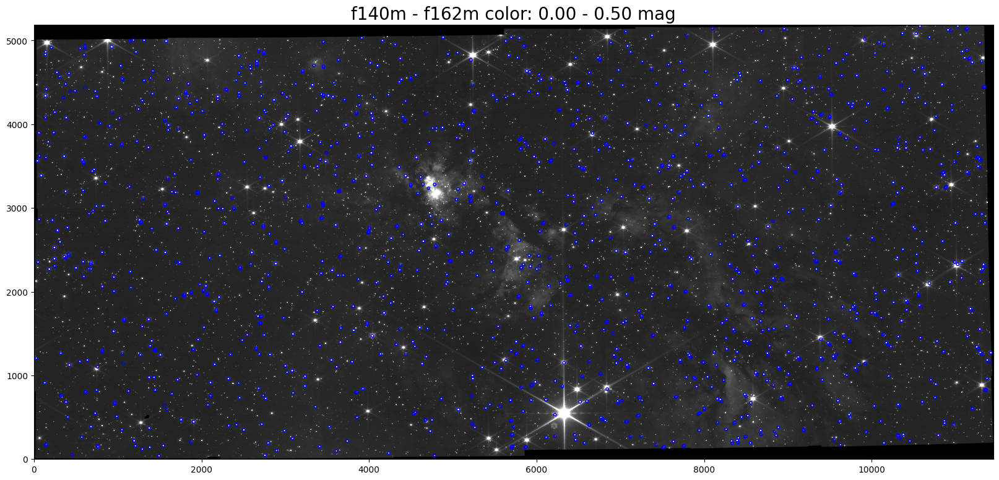

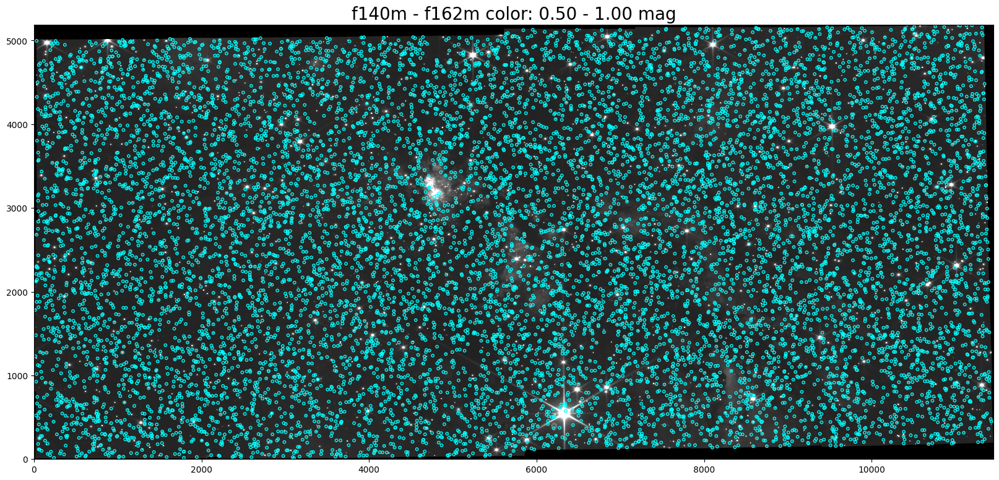

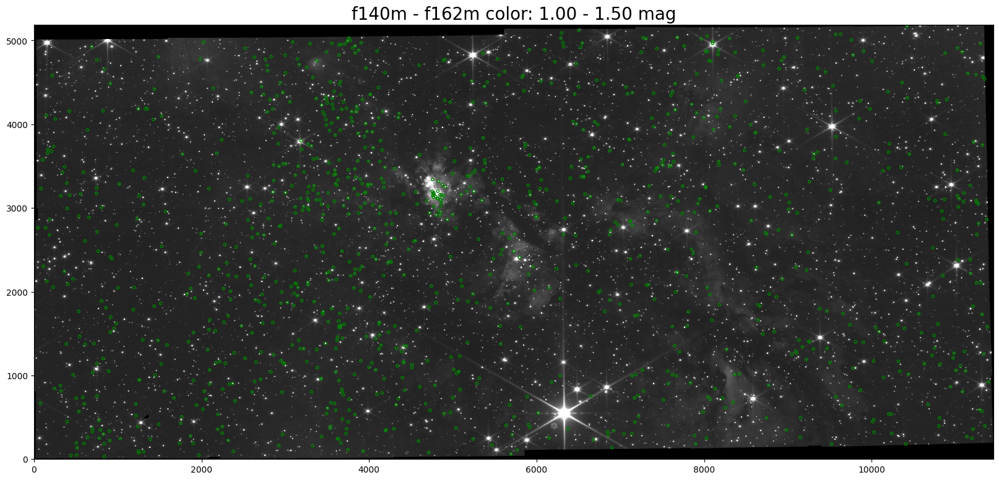

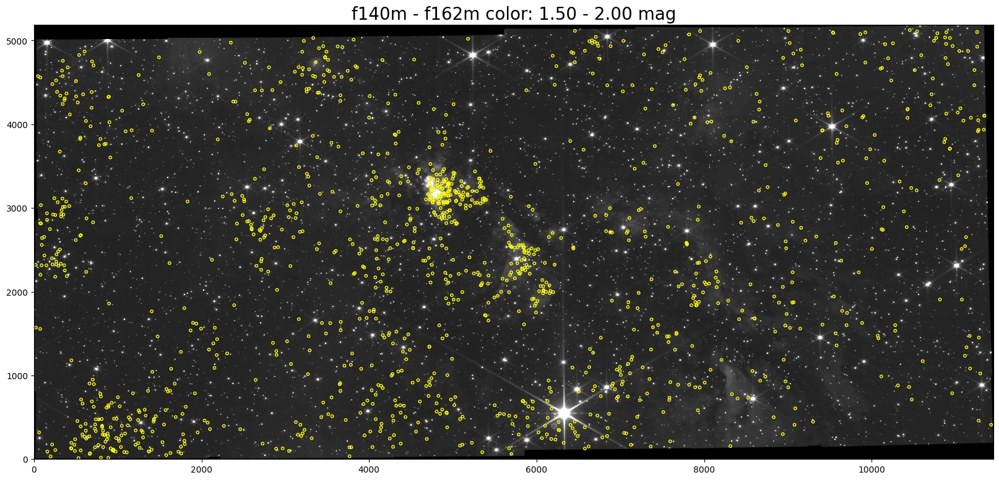

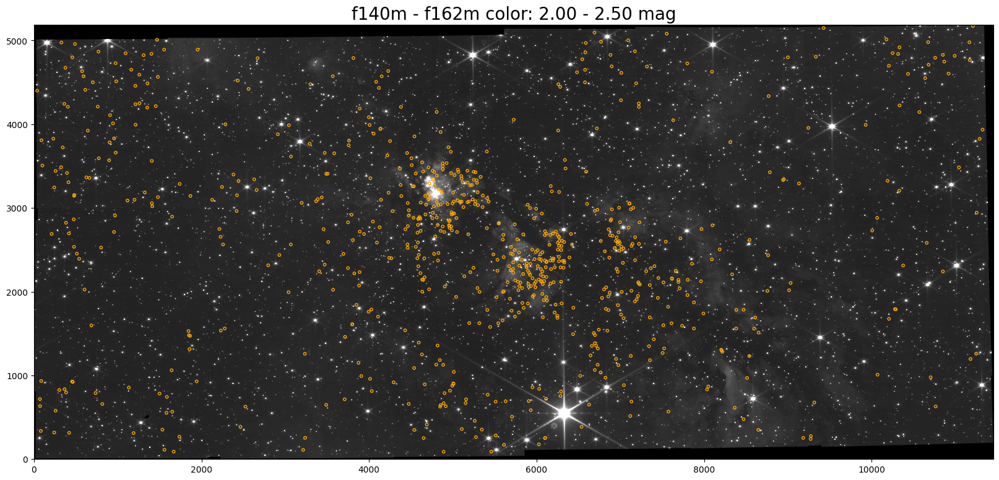

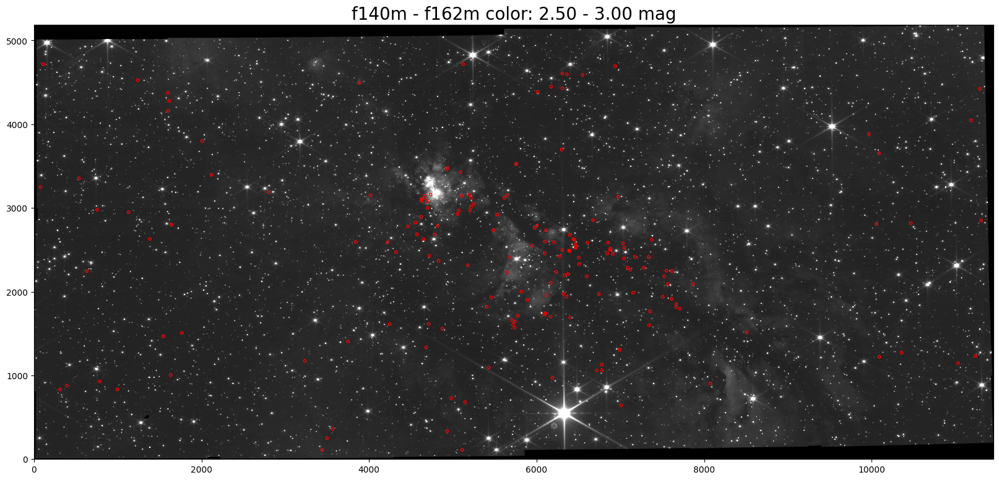

In [6]:
#make 2d histogram of sources with different color value using color like e.g., f140m - f162m
from astropy.visualization import simple_norm
f140m_f162m_color = f140m_mag.value - f162m_mag.value
colorbin = np.linspace(0, 3, 7)
colors_scatter = ['blue', 'cyan', 'green', 'yellow', 'orange', 'red']
print(f140m_f162m_color)
for i in range(len(colorbin)-1):
    spatial_idx1 = np.where((f140m_f162m_color >= colorbin[i]) & (f140m_f162m_color < colorbin[i+1]))[0]
    fig = plt.figure(figsize=(20,20))
    ax1 = fig.add_subplot(1,1,1)
    ax1.imshow(f140m_img, origin='lower', cmap='gray', norm=simple_norm(f140m_img, 'sqrt', percent=99.5))   
    ax1.scatter(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], s=10, edgecolor=colors_scatter[i], facecolor='none') 
    ax1.set_title(f'f140m - f162m color: {colorbin[i]:.2f} - {colorbin[i+1]:.2f} mag', fontsize=20)
    plt.show()
    
# binning the color


[0.71750635 0.68451114 0.74475852 ...        nan        nan        nan]


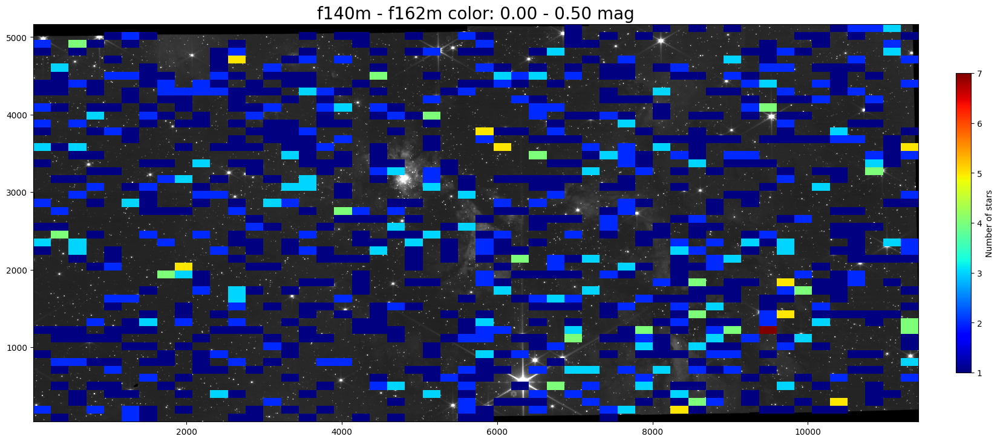

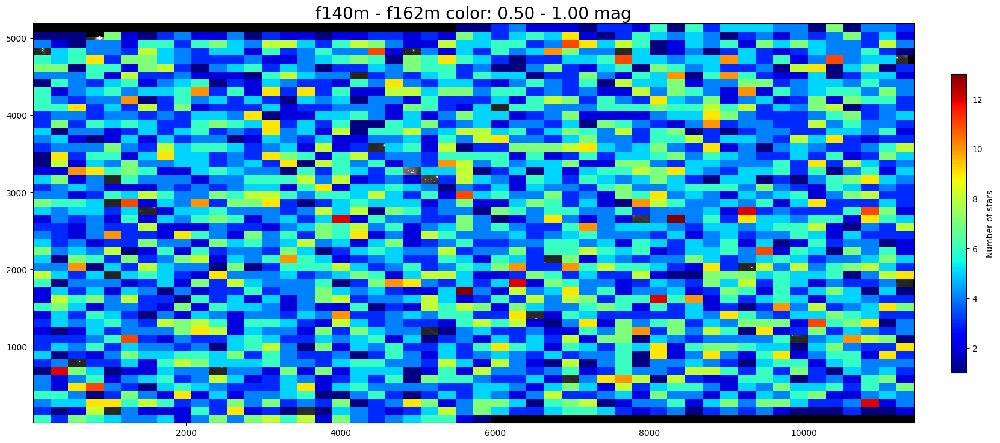

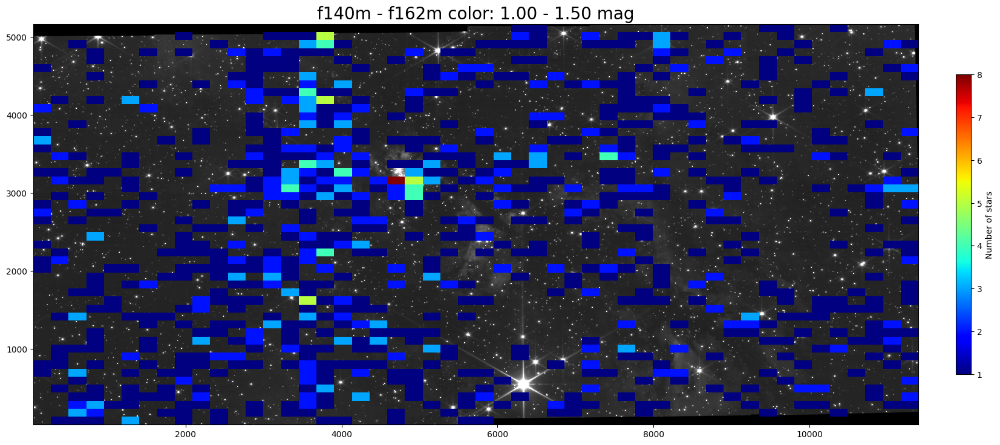

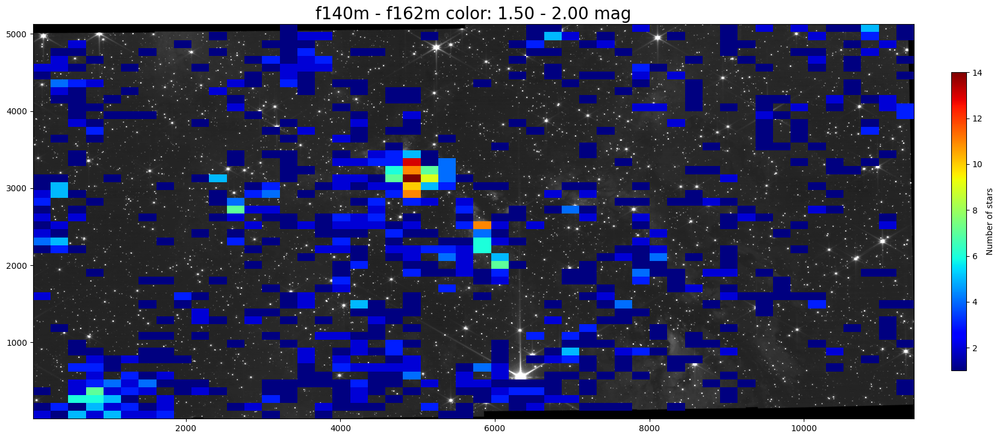

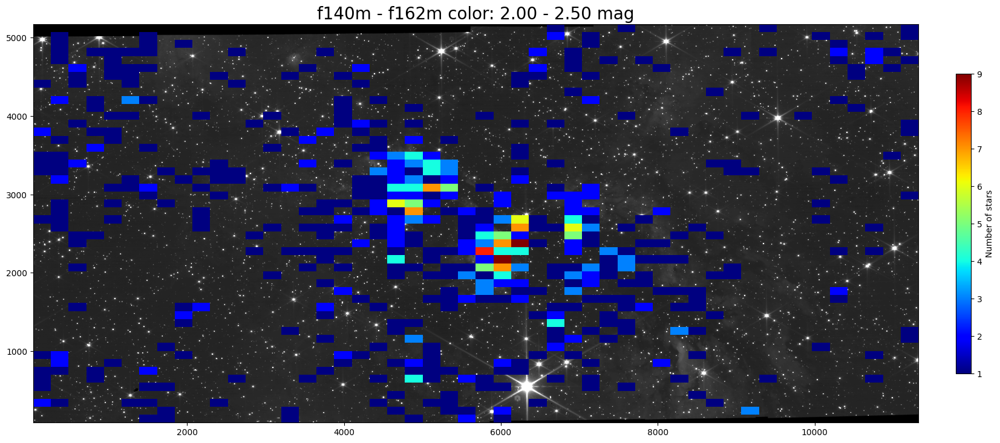

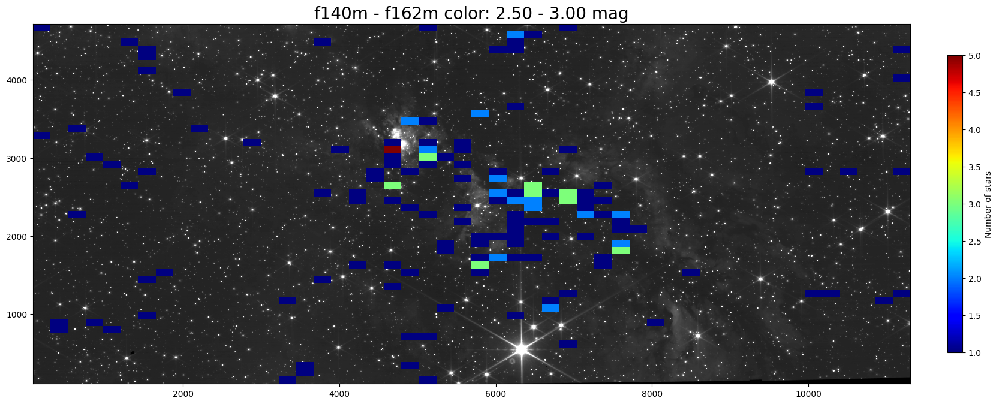

In [12]:
from astropy.visualization import simple_norm
f140m_f162m_color = f140m_mag.value - f162m_mag.value
colorbin = np.linspace(0, 3, 7)
colors_scatter = ['blue', 'cyan', 'green', 'yellow', 'orange', 'red']
print(f140m_f162m_color)
for i in range(len(colorbin)-1):
    spatial_idx1 = np.where((f140m_f162m_color >= colorbin[i]) & (f140m_f162m_color < colorbin[i+1]))[0]
    fig = plt.figure(figsize=(20,20))
    ax1 = fig.add_subplot(1,1,1)
    ax1.imshow(f140m_img, origin='lower', cmap='gray', norm=simple_norm(f140m_img, 'sqrt', percent=99.5))   
    #2d histogram
    #empty cell = fill white color
    plot = ax1.hist2d(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], bins=50, cmap='jet', cmin=1)
    ax1.set_title(f'f140m - f162m color: {colorbin[i]:.2f} - {colorbin[i+1]:.2f} mag', fontsize=20)
    #reduce colorbar length
    plt.colorbar(plot[3], ax=ax1, label='Number of stars', fraction=0.016, pad=0.04)
    plt.show()


Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
2025-10-23 11:18:24,388 - stpipe - WARNING - FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2025-05-06T16:37:42.537' from MJD-BEG.
Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'.
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
2025-10-23 11:18:24,390 - stpipe - WARNING - FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to  -106.570116 from OBSGEO-[XYZ].
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'.


[       nan 0.06981947        nan ...        nan        nan 1.23268563]


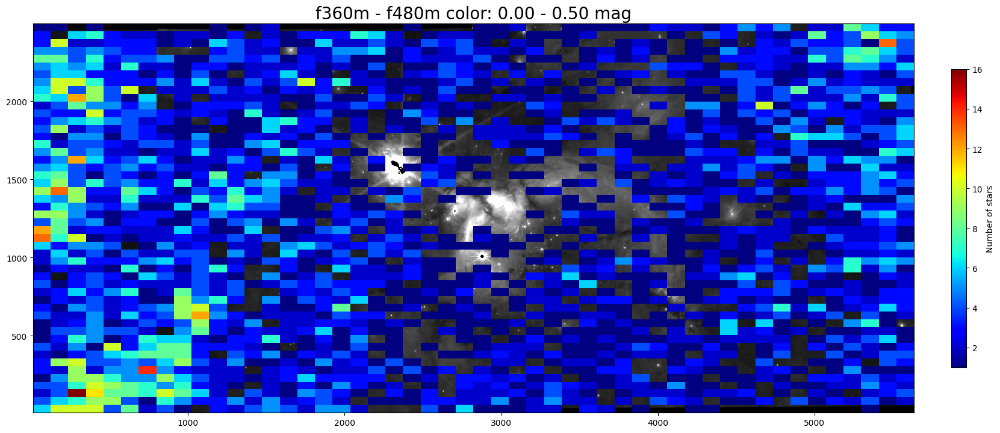

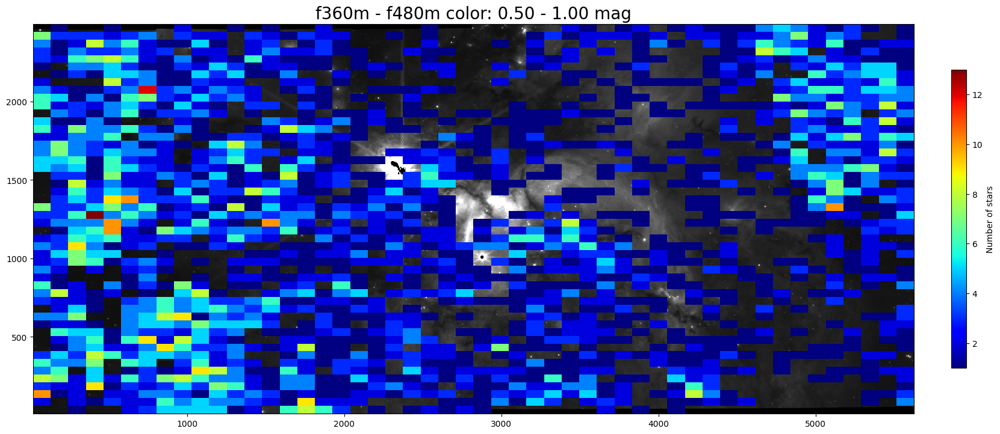

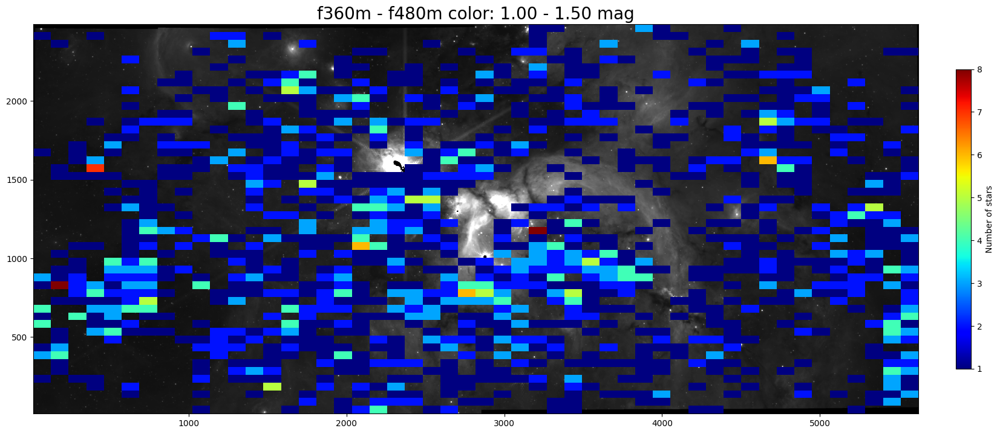

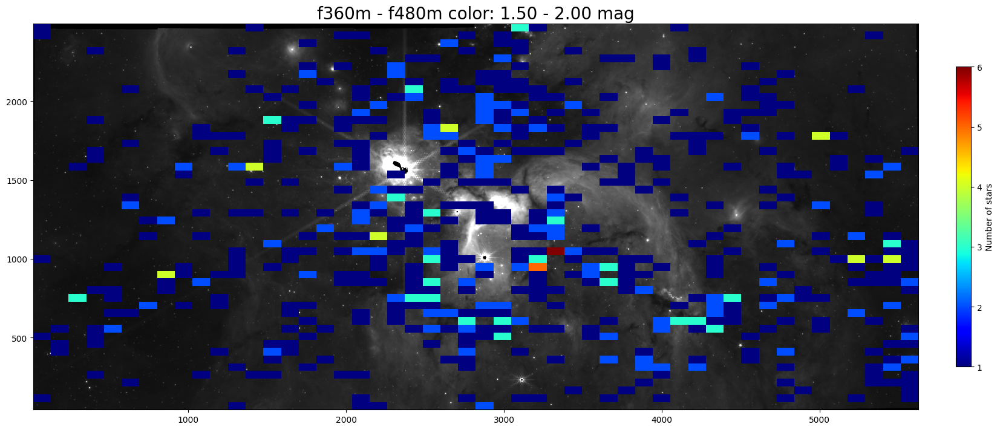

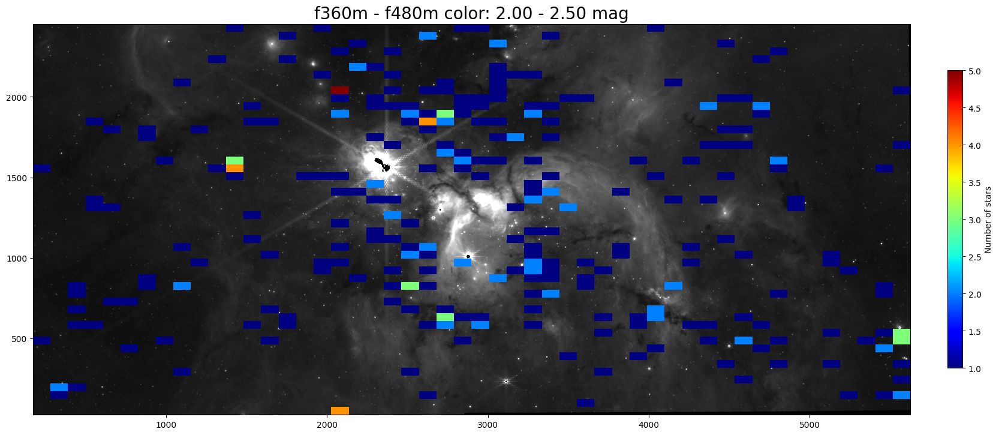

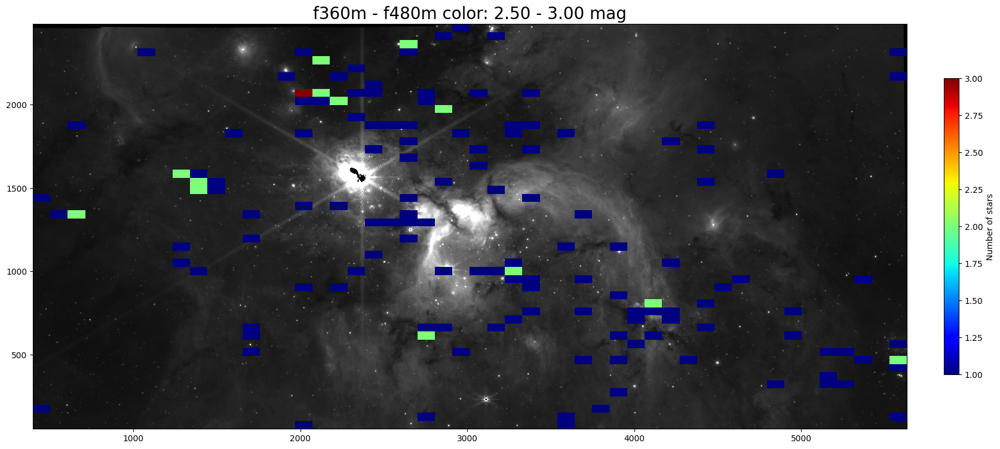

In [14]:
#do the same thing for F360M -F480M
f480m_img = fits.getdata(image_filenames['f480m'], ext=('SCI', 1))
f480m_wcs = WCS(f480m_header)
pixelcoord = f480m_wcs.world_to_pixel(catalog['skycoord'])
from astropy.visualization import simple_norm
f360m_f480m_color = f360m_mag.value - f480m_mag.value
colorbin = np.linspace(0, 3, 7)
colors_scatter = ['blue', 'cyan', 'green', 'yellow', 'orange', 'red']
print(f360m_f480m_color)
for i in range(len(colorbin)-1):
    spatial_idx1 = np.where((f360m_f480m_color >= colorbin[i]) & (f360m_f480m_color < colorbin[i+1]))[0]
    fig = plt.figure(figsize=(20,20))
    ax1 = fig.add_subplot(1,1,1)
    ax1.imshow(f480m_img, origin='lower', cmap='gray', norm=simple_norm(f480m_img, 'sqrt', percent=99.5))   
    #2d histogram
    #empty cell = fill white color
    plot = ax1.hist2d(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], bins=50, cmap='jet', cmin=1)
    ax1.set_title(f'f360m - f480m color: {colorbin[i]:.2f} - {colorbin[i+1]:.2f} mag', fontsize=20)
    #reduce colorbar length
    plt.colorbar(plot[3], ax=ax1, label='Number of stars', fraction=0.016, pad=0.04)
    plt.show()
